# Name: Ahmed Emad Tawfik Ahmed
# Reg ID: 211000031

# Exercise 1:

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-8-17 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5x summary: 444 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
Adding AutoShape... 
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


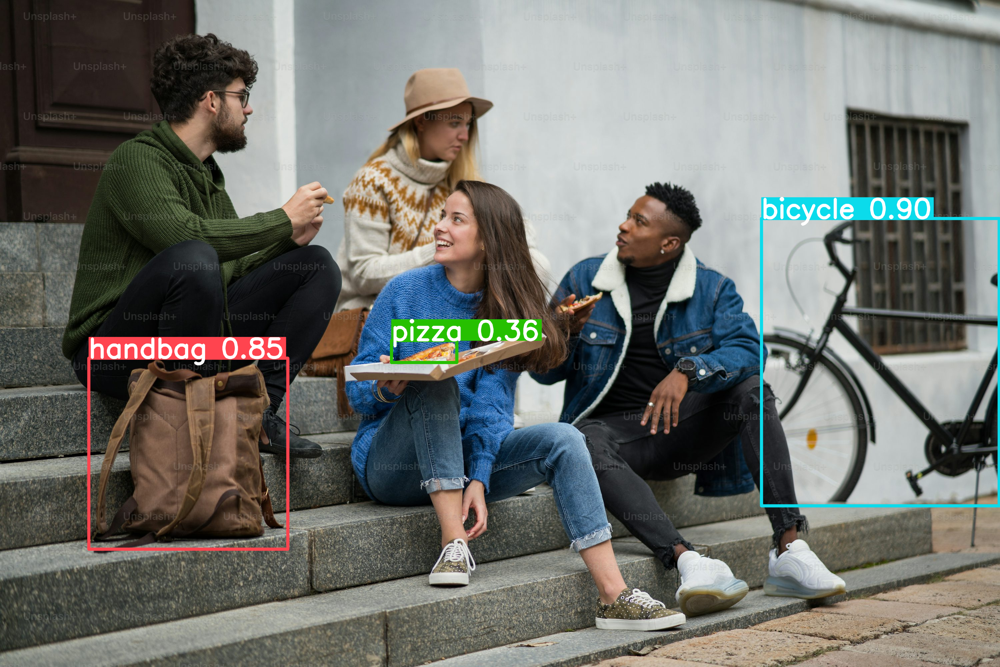

In [13]:
import torch

model_5x = torch.hub.load('ultralytics/yolov5', 'yolov5x')
img_path = "https://plus.unsplash.com/premium_photo-1663126450082-5c516dd3d9b2?fm=jpg&q=60&w=3000&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8MXx8cGVvcGxlJTIwaW4lMjBjaXR5fGVufDB8fDB8fHww"

results = model_5x(img_path)

# (26: handbags, 1: bicycles, 53: pizza)
target_classes = torch.tensor([26, 1, 53], device=results.pred[0].device)

# Use isin to filter the classes
filtered_results = results.pred[0][torch.isin(results.pred[0][:, 5], target_classes)]

# Update results with the filtered detections
results.pred[0] = filtered_results

# Show filtered results
results.show()


# Excercise 2

# Cloneing the YOLOv5 Repo

In [1]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5


fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [2]:
!pip install -U -r requirements.txt

  Using cached numpy-2.0.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)


# Getting the dataset from RoboFlow

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("basaw").project("plant-disease-tsxmt")
version = project.version(2)
dataset = version.download("yolov5")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.9 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Plant-Disease-2 in yolov5pytorch:: 100%|██████████| 1812/1812 [00:00<00:00, 3826.70it/s]


# Training YOLO on the Custom Dataset

In [14]:
!python train.py --img 640 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5x.pt

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      41/99      13.2G   0.008757   0.006961   0.005158         46        640:  35% 14/40 [00:16<00:30,  1.16s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      41/99      13.2G    0.00973   0.006945   0.005611         43        640:  38% 15/40 [00:17<00:29,  1.19s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      41/99      13.2G   0.009663   0.006941   0.006027         44        640:  40% 16/40 [00:18<00:28,  1.19s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):


# Validation

In [15]:
!python val.py --data {dataset.location}/data.yaml --weights runs/train/exp/weights/best.pt --task val

val: data=/content/yolov5/Plant-Disease-2/data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-353-g5eca7b9c Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/Plant-Disease-2/valid/labels.cache... 180 images, 0 backgrounds, 0 corrupt: 100% 180/180 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 6/6 [00:07<00:00,  1.21s/it]
                   all        180        180      0.564      0.844      0.672        0.5
Pepper__bell___Bacterial_spot        180         60      0.433      0.767      0.503     

# Testing

In [16]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.2 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Plant-Disease-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-353-g5eca7b9c Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/90 /content/yolov5/Plant-Disease-2/test/images/002a55fb-7a3d-4a3a-aca8-ce2d5ebc6925___RS_Early-B-8170_JPG.rf.4abcb4160f287dc4c3ff8021f2ca4b2d.jpg: 640x640 1 Potato___Early_blight, 11.4ms
image 2/90 /content/yolov5/Plant-Disease-2/test/images/02baf62e-11e2-4dde-97fb-e369b57d55d3___JR_B-Spot-8971_JP

# Displaying Test Results

In [ ]:
import glob
from IPython.display import Image, display

i=0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  print(imageName)
  display(Image(filename=imageName))
  print("\n")